# Tutorial 1 - Intro to neural ODE based Neural Networks
The goal of this tutorial is to get familiar with the fundamentals of the code basis and ensure it is running  
The notebook utilizes code from the package torchdiffeq and Borjan Geshkovski https://github.com/borjanG/2021-dynamical-systems

In [26]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

import matplotlib.pyplot as plt
import numpy as np



# Juptyer magic: For export. Makes the plots size right for the screen 
%matplotlib inline
# %config InlineBackend.figure_format = 'retina'

%config InlineBackend.figure_formats = ['svg'] 


torch.backends.cudnn.deterministic = True
torch.manual_seed(2)
torch.cuda.manual_seed(2)

g = torch.Generator()
g.manual_seed(1)


# Data preparation

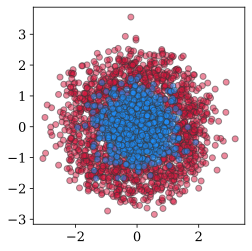

In [27]:
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons, make_circles, make_blobs
from sklearn.preprocessing import StandardScaler

from torch.utils import data as data
from torch.utils.data import DataLoader, TensorDataset

def create_dataloader(data_type, batch_size = 3000, noise = 0.15, factor = 0.15, random_state = 1, shuffle = False):
    if data_type == 'circles':
        X, y = make_circles(batch_size, noise=noise, factor=factor, random_state=random_state, shuffle = shuffle)
        
        
    elif data_type == 'blobs':
        centers = [[-1, -1], [1, 1]]
        X, y = make_blobs(
    n_samples=batch_size, centers=centers, cluster_std=noise, random_state=0)
        
        
    elif data_type == 'moons':
        X, y = make_moons(batch_size, noise = noise, shuffle = shuffle , random_state = 0)
    
    
    elif data_type == 'xor':
        X = torch.randint(low=0, high=2, size=(batch_size, 2), dtype=torch.float32)
        y = np.logical_xor(X[:, 0] > 0, X[:, 1] > 0).float()
        # y = y.to(torch.int64)
        X += noise * torch.randn(X.shape)
        
        
    else: 
        print('datatype not supported')
        return None, None

    g = torch.Generator()
    g.manual_seed(random_state)
    
    X = StandardScaler().fit_transform(X)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.05 ) #random_state=2, shuffle = shuffle)

    X_train = torch.Tensor(X_train) # transform to torch tensor for dataloader
    y_train = torch.Tensor(y_train) #transform to torch tensor for dataloader

    X_test = torch.Tensor(X_test) # transform to torch tensor for dataloader
    y_test = torch.Tensor(y_test) #transform to torch tensor for dataloader

    X_train = X_train.type(torch.float32)  #type of orginial pickle.load data
    y_train = y_train.type(torch.int64) #dtype of original picle.load data

    X_test = X_test.type(torch.float32)  #type of orginial pickle.load data
    y_test = y_test.type(torch.int64) #dtype of original picle.load data


    train_data = TensorDataset(X_train,y_train) # create your datset
    test_data = TensorDataset(X_test, y_test)

    train = DataLoader(train_data, batch_size=64, shuffle=shuffle, generator=g)
    test = DataLoader(test_data, batch_size=256, shuffle=shuffle, generator = g) #128 before
    
    data_0 = X_train[y_train == 0]
    data_1 = X_train[y_train == 1]
    fig = plt.figure()
    plt.scatter(data_0[:, 0], data_0[:, 1], edgecolor="#333", color = 'crimson', alpha = 0.5)
    plt.scatter(data_1[:, 0], data_1[:, 1], edgecolor="#333", color = 'dodgerblue', alpha = 0.5)
    ax = plt.gca()
    ax.set_aspect('equal')
    plt.show()
    
    return train, test


data_noise = 0.3
dataloader, dataloader_viz = create_dataloader('circles', noise = data_noise)



#Visualizing the data


In [28]:
#We can now conveniently access the data from the dataloaders
for X_test, y_test in dataloader_viz:
    print(X_test[:10], y_test[:10])
    break
    

tensor([[ 1.1996, -0.3037],
        [-1.2065,  0.3431],
        [-0.5472,  0.6110],
        [-1.7357, -0.0294],
        [-1.0831,  1.4596],
        [-0.7022,  1.3448],
        [ 1.2592, -1.2512],
        [ 1.9666,  1.2053],
        [ 0.2428, -0.9781],
        [-1.3644,  0.5034]]) tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0])


# Model dynamics

In [29]:
#Import of the model dynamics that describe the neural ODE
#The dynamics are based on the torchdiffeq package, that implements ODE solvers in the pytorch setting
from models.neural_odes import NeuralODE

#for neural ODE based networks the network width is constant. In this example the input is 2 dimensional
hidden_dim, data_dim = 2, 2 

#T is the end time of the neural ODE evolution, num_steps are the amount of discretization steps for the ODE solver
T, num_steps = 5.0, 5
dt = T/num_steps
bound = 0.
fp = False
cross_entropy = True
turnpike = False


non_linearity = 'tanh' #'relu' #
architecture = 'inside' #outside

v_steps = 5


torch.manual_seed(2)
torch.cuda.manual_seed(2)
anode = NeuralODE(device, data_dim, hidden_dim, augment_dim=0, non_linearity=non_linearity, 
                    architecture=architecture, T=T, time_steps=num_steps, fixed_projector=fp, cross_entropy=cross_entropy)
optimizer_anode = torch.optim.Adam(anode.parameters(), lr=1e-3) 


print(anode)



NeuralODE(
  (flow): Semiflow(
    (dynamics): Dynamics(
      (non_linearity): Tanh()
      (fc2_time): Sequential(
        (0): Linear(in_features=2, out_features=2, bias=True)
        (1): Linear(in_features=2, out_features=2, bias=True)
        (2): Linear(in_features=2, out_features=2, bias=True)
        (3): Linear(in_features=2, out_features=2, bias=True)
        (4): Linear(in_features=2, out_features=2, bias=True)
      )
    )
  )
  (linear_layer): Linear(in_features=2, out_features=2, bias=True)
  (non_linearity): Tanh()
)


In [30]:
torch.manual_seed(2)
torch.cuda.manual_seed(2)
rnode = NeuralODE(device, data_dim, hidden_dim, augment_dim=0, non_linearity=non_linearity, 
                    architecture=architecture, T=T, time_steps=num_steps, fixed_projector=fp, cross_entropy=cross_entropy)
optimizer_rnode = torch.optim.Adam(rnode.parameters(), lr=1e-3) 


print(rnode)

NeuralODE(
  (flow): Semiflow(
    (dynamics): Dynamics(
      (non_linearity): Tanh()
      (fc2_time): Sequential(
        (0): Linear(in_features=2, out_features=2, bias=True)
        (1): Linear(in_features=2, out_features=2, bias=True)
        (2): Linear(in_features=2, out_features=2, bias=True)
        (3): Linear(in_features=2, out_features=2, bias=True)
        (4): Linear(in_features=2, out_features=2, bias=True)
      )
    )
  )
  (linear_layer): Linear(in_features=2, out_features=2, bias=True)
  (non_linearity): Tanh()
)


In [31]:
from models.training import Trainer

num_epochs = 1 #number of optimization runs in which the dataset is used for gradient decent
trainer_anode = Trainer(anode, optimizer_anode, device, cross_entropy=cross_entropy, turnpike = turnpike,
                         bound=bound, fixed_projector=fp, verbose = True) 

trainer_anode.train(dataloader, num_epochs)


Epoch 0/45
Loss: 0.950
Accuracy: 0.547


/Users/Tobi/FAUbox/Python/borjan dynamical.systems/models/training.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  softpred = m(y_pred)



Epoch 10/45
Loss: 0.847
Accuracy: 0.469

Epoch 20/45
Loss: 0.914
Accuracy: 0.453

Epoch 30/45
Loss: 0.908
Accuracy: 0.453

Epoch 40/45
Loss: 0.819
Accuracy: 0.438
Epoch 1: 0.872


In [32]:
from models.training import doublebackTrainer

# num_epochs = 120 #number of optimization runs in which the dataset is used for gradient decent
trainer_rnode = doublebackTrainer(rnode, optimizer_rnode, device, cross_entropy=cross_entropy, turnpike = turnpike,
                         bound=bound, fixed_projector=fp, verbose = True, eps = 0.3) 

trainer_rnode.train(dataloader, num_epochs)


Epoch 0/45
Loss: 0.950
Accuracy: 0.547

Epoch 10/45
Loss: 0.848
Accuracy: 0.469

Epoch 20/45
Loss: 0.910
Accuracy: 0.469

Epoch 30/45
Loss: 0.906
Accuracy: 0.422

Epoch 40/45
Loss: 0.817
Accuracy: 0.422
Epoch 1: 0.869


## Generate a gif of the evolution of the input points through the neural network

Observe that the blue and red data points are getting seperated further as time passes.

In [33]:
import seaborn as sns
from matplotlib.colors import to_rgba, to_rgb
import numpy as np
import torch.nn as nn

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

@torch.no_grad()
def classification_evolution(model, data, label, grad = None, fig_name=None, footnote=None, contour = True, x1lims = [-2, 2], x2lims = [-2, 2], layer = -1):
    
    
    x1lower, x1upper = x1lims
    x2lower, x2upper = x2lims

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    if isinstance(data, torch.Tensor):
        data = data.cpu().numpy()
    if isinstance(label, torch.Tensor):
        label = label.cpu().numpy()
    data_0 = data[label == 0]
    data_1 = data[label == 1]

    fig = plt.figure(figsize=(5, 5), dpi=300)
    plt.scatter(data_0[:, 0], data_0[:, 1], edgecolor="#333", label="Class 0", zorder = 1)
    plt.scatter(data_1[:, 0], data_1[:, 1], edgecolor="#333", label="Class 1", zorder = 1)

    plt.ylabel(r"$x_2$")
    plt.xlabel(r"$x_1$")
    plt.figtext(0.5, 0, footnote, ha="center", fontsize=10)
    # plt.legend()
    if grad is not None:
        for i in range(len(data[:, 0])):
            plt.arrow(data[i, 0], data[i, 1], grad[i, 0], grad[i, 1],
                    head_width=0.05, head_length=0.1, fc='k', ec='k', alpha=0.5)

   
    model.to(device)
    # creates the RGB values of the two scatter plot colors.
    # c0 = torch.Tensor(to_rgba("C0")).to(device)
    # c1 = torch.Tensor(to_rgba("C1")).to(device)

    

    x1 = torch.arange(x1lower, x1upper, step=0.01, device=device)
    x2 = torch.arange(x2lower, x2upper, step=0.01, device=device)
    xx1, xx2 = torch.meshgrid(x1, x2)  # Meshgrid function as in numpy
    model_inputs = torch.stack([xx1, xx2], dim=-1)
    
    
    _, proj_traj = model(model_inputs)
    
    # for i in range(inputs.shape[0]):
    #     interp_x.append(interp1d(integration_time, trajectories[:, i, 0], kind='cubic', fill_value='extrapolate'))
        
    preds = proj_traj[layer,:,:]
    # dim = 2 means that it normalizes along the last dimension, i.e. along the two predictions that are the model output
    m = nn.Softmax(dim=2)
    # softmax normalizes the model predictions to probabilities
    preds = m(preds)

    # now we only want to have the probability for being in class1 (as prob for class2 is then 1- class1)
    preds = preds[:, :, 0]
    preds = preds.unsqueeze(2)  # adds a tensor dimension at position 2
    # Specifying "None" in a dimension creates a new one. The rgb values hence get rescaled according to the prediction
    # output_image = (1 - preds) * c1[None, None] + preds * c0[None, None]
    # # Convert to numpy array. This only works for tensors on CPU, hence first push to CPU
    # output_image = output_image.cpu().numpy()
    # plt.imshow(output_image, origin='lower', extent=(x1lower, x1upper, x2lower, x2upper), zorder = -1)
    
    plt.grid(False)
    plt.xlim([x1lower, x1upper])
    plt.ylim([x2lower, x2upper])
    # plt.axis('scaled')

    # labels_predicted = [0 if value <= 0.5 else 1 for value in labels_predicted.numpy()]
    if contour:
        colors = [to_rgb("C1"), [1, 1, 1], to_rgb("C0")] # first color is black, last is red
        cm = LinearSegmentedColormap.from_list(
            "Custom", colors, N=40)
        z = np.array(preds).reshape(xx1.shape)
        
        plt.contourf(xx1, xx2, z, alpha=1, cmap=cm, zorder = 0, extent=(x1lower, x1upper, x2lower, x2upper)) #plt.get_cmap('coolwarm')
        



    # preds_contour = preds.view(len(x1), len(x1)).detach()
    # plt.contourf(xx1, xx2, preds_contour, alpha=1)
    if fig_name:
        plt.savefig(fig_name + '.png', bbox_inches='tight', dpi=300, format='png', facecolor = 'white')
        plt.clf()
        plt.close()
    # return fig

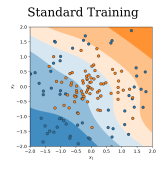

In [34]:
import imageio
import os
fig_name_base = 'levelsets'
fig_name = fig_name_base + '.png'
gif_name = fig_name_base + '_comp.gif'

fig_name_base_rob = fig_name_base + '_rob'
fig_name_rob = fig_name_base_rob + '.png'

plt.figure(dpi = 600)
plt.subplot(121)
levelsets = imageio.imread('levelsets.png')
plt.imshow(levelsets)
plt.title('Standard Training')
plt.axis('off')


for X_viz, y_viz in dataloader_viz:
    imgs = []
    for layer in torch.arange(num_steps):
        classification_evolution(anode, X_viz, y_viz, fig_name = fig_name_base, layer = layer)
        # imgs.append(imageio.imread(fig_name))
        classification_evolution(rnode, X_viz, y_viz, fig_name = fig_name_base_rob, layer = layer)
        
        plt.figure(dpi = 600)
        plt.subplot(121)
        levelsets = imageio.imread(fig_name)
        plt.imshow(levelsets)
        plt.title('Standard Training')
        plt.axis('off')

        plt.subplot(122)
        levelsets_rob = imageio.imread(fig_name_rob)
        plt.imshow(levelsets_rob)
        plt.title('Robust Training')
        plt.axis('off')
        plt.savefig('levelsets_comp.png', bbox_inches='tight', dpi=300, format='png', facecolor = 'white')
        plt.clf()
        plt.close()
        
        imgs.append(imageio.imread('levelsets_comp.png'))
        if not (num_steps == layer + 1): os.remove(fig_name_rob) #keep last image
    imageio.mimwrite(gif_name, imgs, fps = 2)
    # visualize_classification(rnode, X_viz, y_viz, fig_name = 'class_test1')
    break

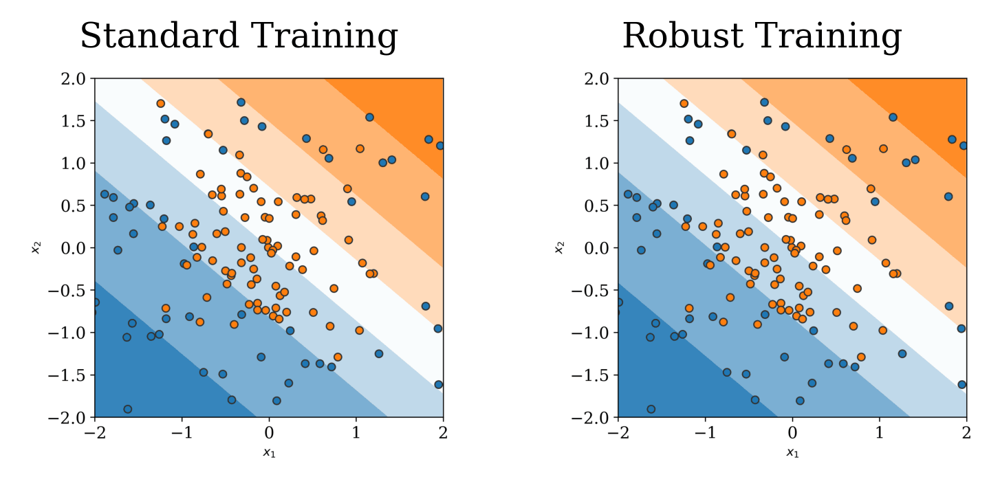

In [35]:
from IPython.display import Image
Image(filename="levelsets_comp.gif",  width = 800)

In [36]:
fig_name_base = 'levelsets_rob'
fig_name = fig_name_base + '.png'
gif_name = fig_name_base + '.gif'

for X_viz, y_viz in dataloader_viz:
    imgs = []
    for layer in torch.arange(num_steps):
        classification_evolution(rnode, X_viz, y_viz, fig_name = fig_name_base, layer = layer)
        imgs.append(imageio.imread(fig_name))
        # if not (num_steps == layer + 1): os.remove(fig_name) #keep last image
    imageio.mimwrite(gif_name, imgs, fps = 2)
    # visualize_classification(rnode, X_viz, y_viz, fig_name = 'class_test1')
    break

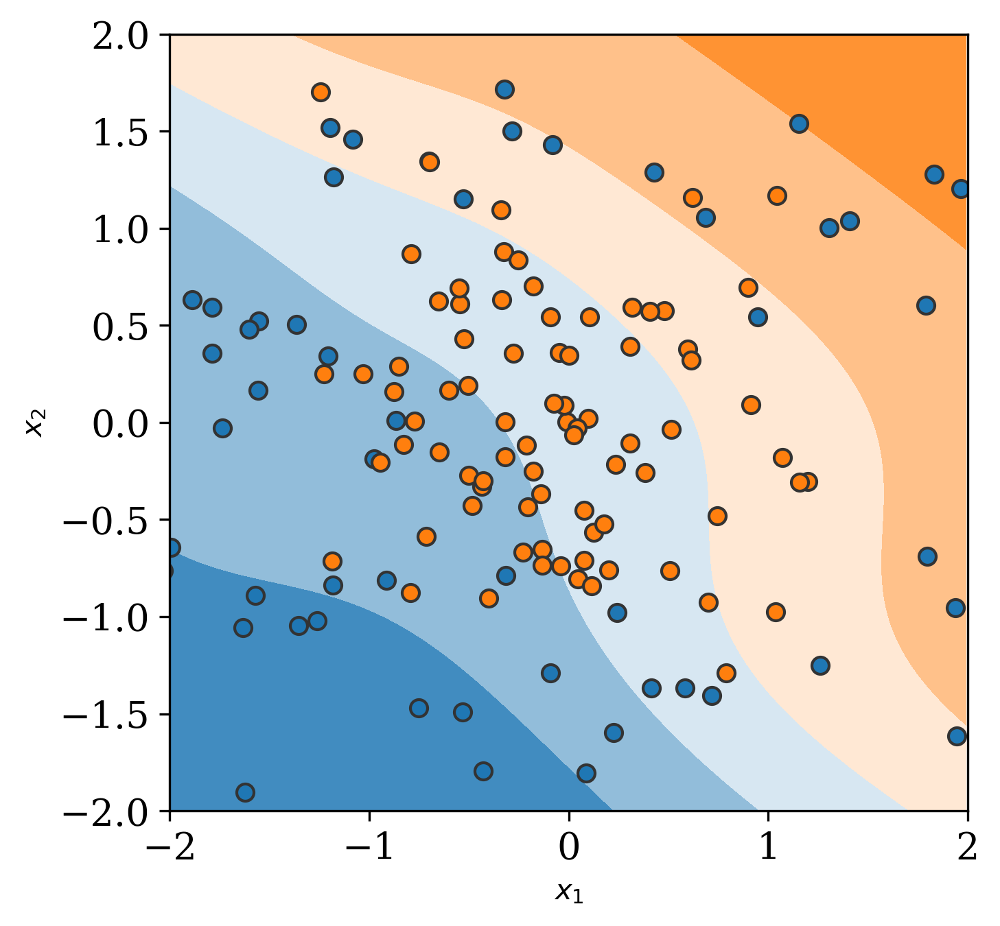

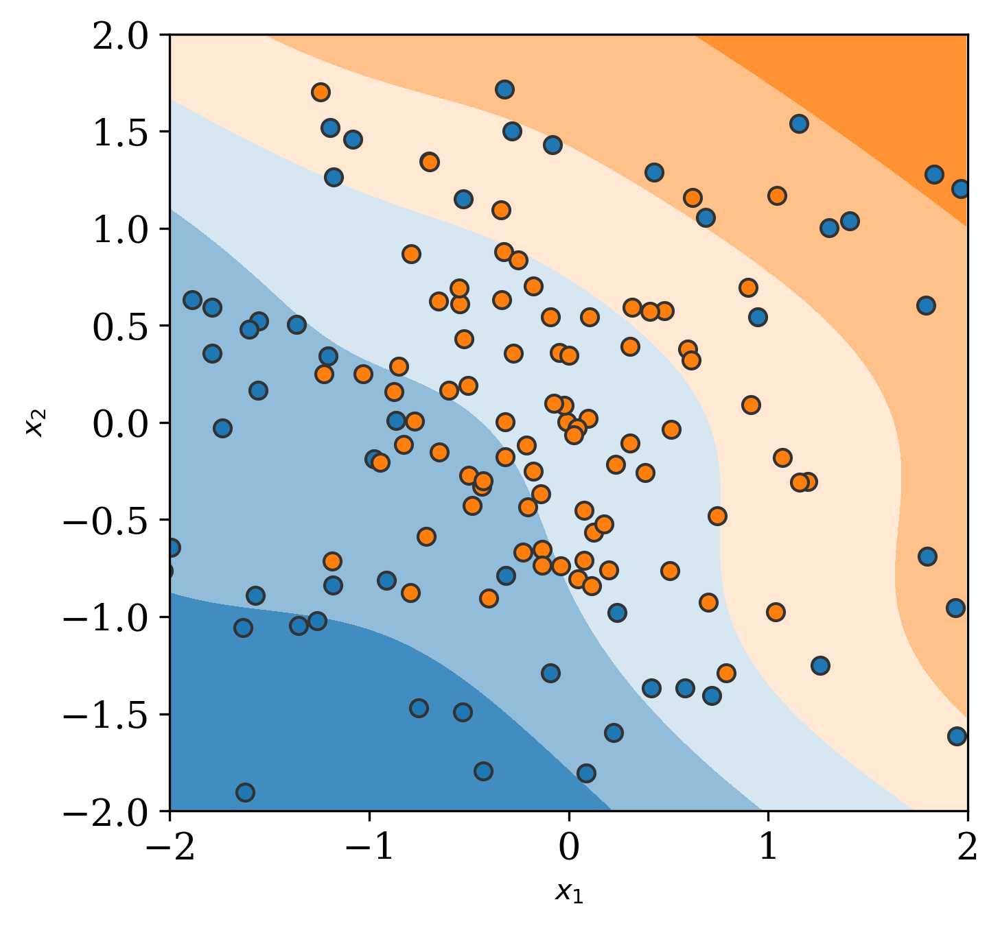

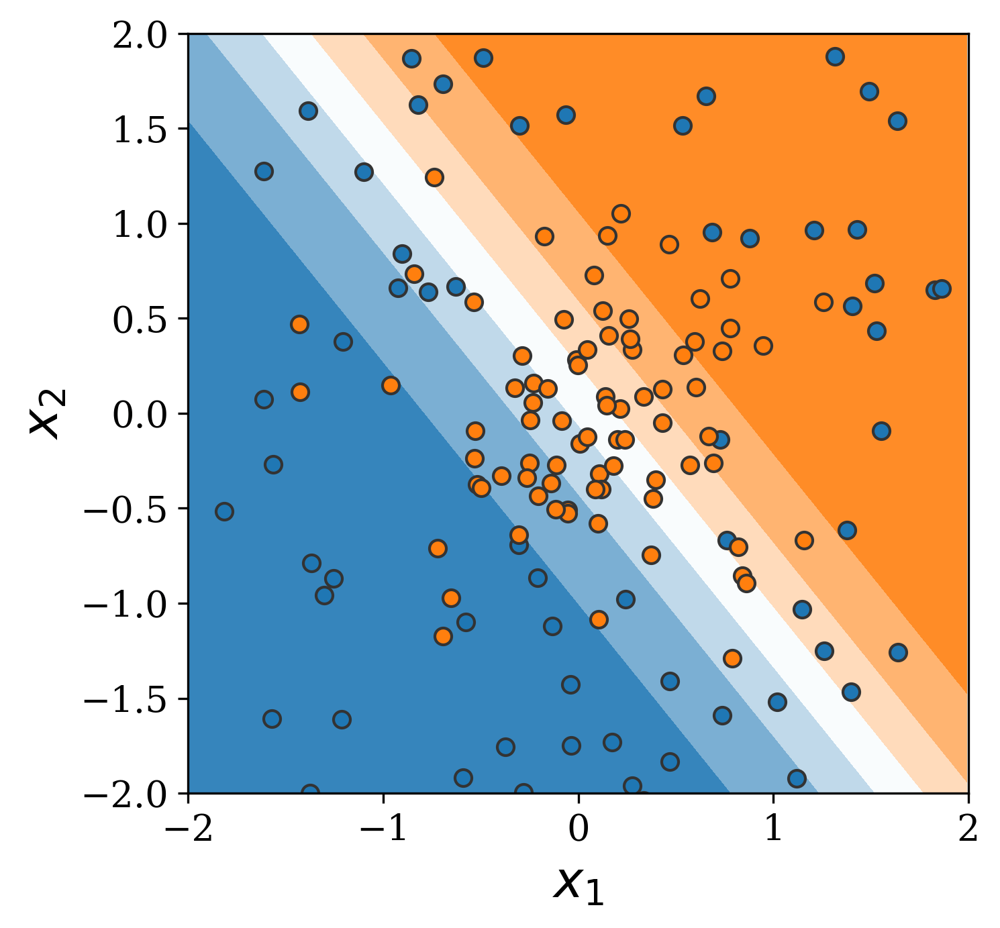

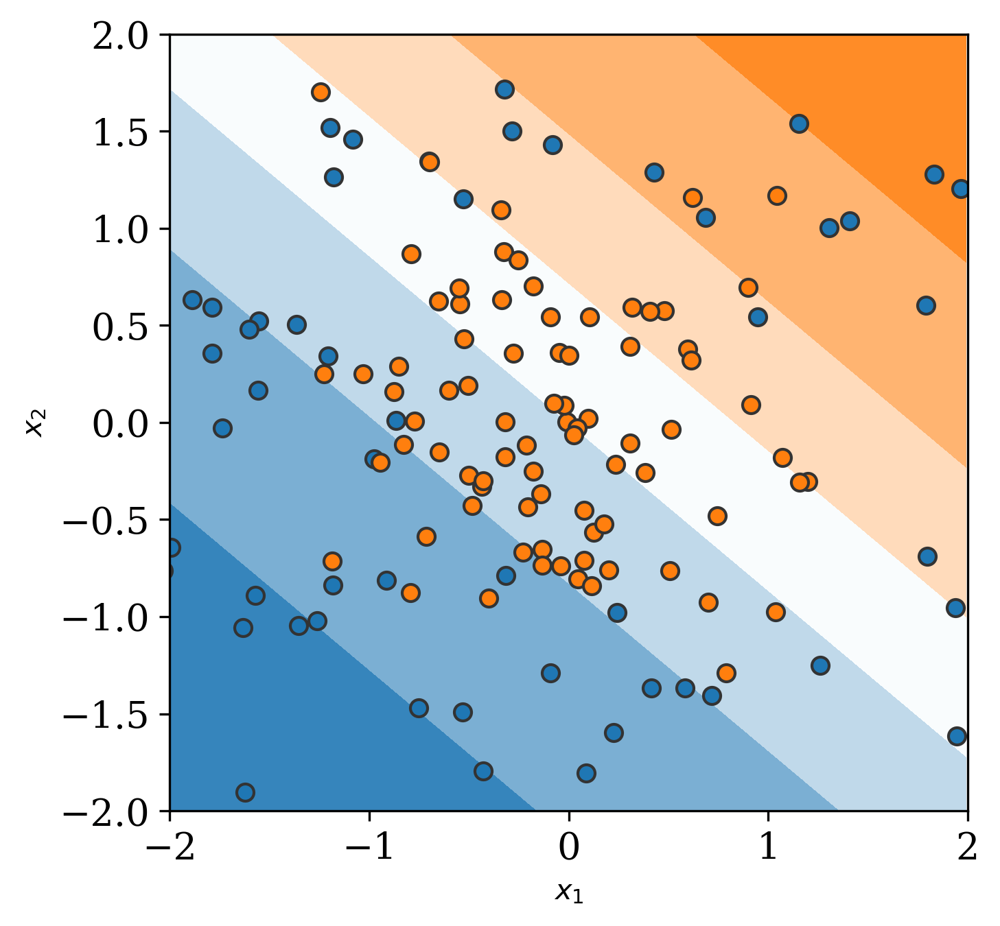

In [37]:
from IPython.display import Image
X = Image(filename="levelsets.png",  width = 400)
Y = Image(filename="levelsets_rob.png", width = 400)

display(X,Y)

X = Image(filename="levelsets.gif",  width = 400)
Y = Image(filename="levelsets_rob.gif", width = 400)

display(X,Y)


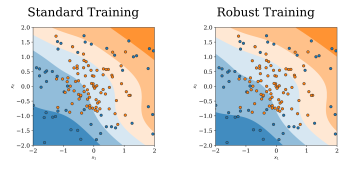

In [38]:
import imageio

plt.figure(dpi = 600)
plt.subplot(121)
levelsets = imageio.imread('levelsets.png')
plt.imshow(levelsets)
plt.title('Standard Training')
plt.axis('off')

plt.subplot(122)
levelsets_rob = imageio.imread('levelsets_rob.png')
plt.imshow(levelsets_rob)
plt.title('Robust Training')
plt.axis('off')
plt.savefig('levelsets_comp.png', bbox_inches='tight', dpi=300, format='png', facecolor = 'white')
plt.show()

In [39]:
from plots.gifs import trajectory_gif

#the function trajectory_gif creates the evolution trajectories of the input data through the network
#the passing time corresponds to the depth of the network

for X_viz, y_viz in dataloader_viz:
    trajectory_gif(anode, X_viz, y_viz, timesteps=num_steps, filename = 'trajectory.gif')
    break

#Display of the generated gif

from IPython.display import Image
Image(filename="trajectory.gif", retina = True)

In [ ]:
from plots.gifs import trajectory_gif

#the function trajectory_gif creates the evolution trajectories of the input data through the network
#the passing time corresponds to the depth of the network

for X_viz, y_viz in dataloader_viz:
    trajectory_gif(rnode, X_viz, y_viz, timesteps=num_steps, filename = 'trajectory_db.gif')
    break

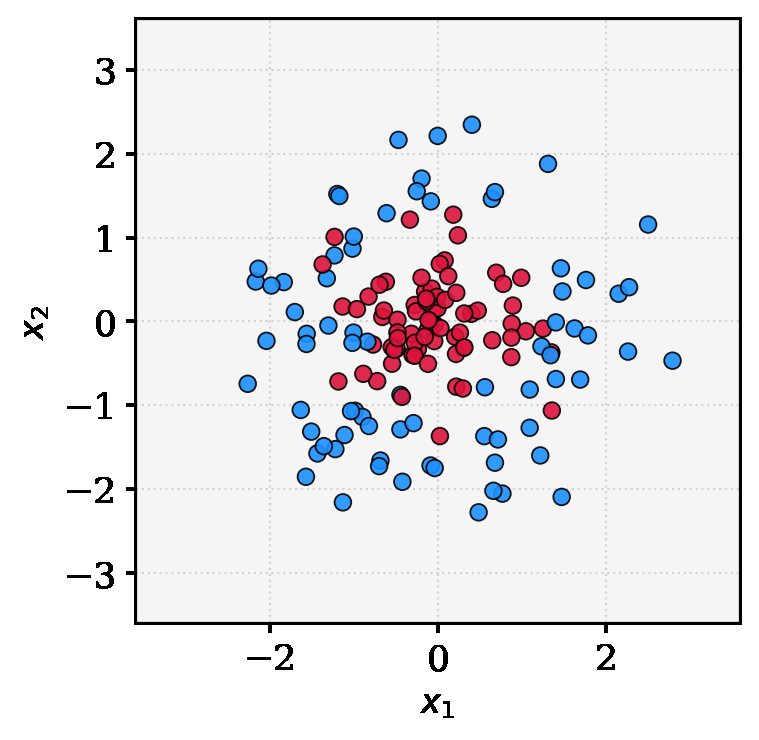

In [ ]:
#Display of the generated gif

from IPython.display import Image
Image(filename="trajectory_db.gif", retina = True)

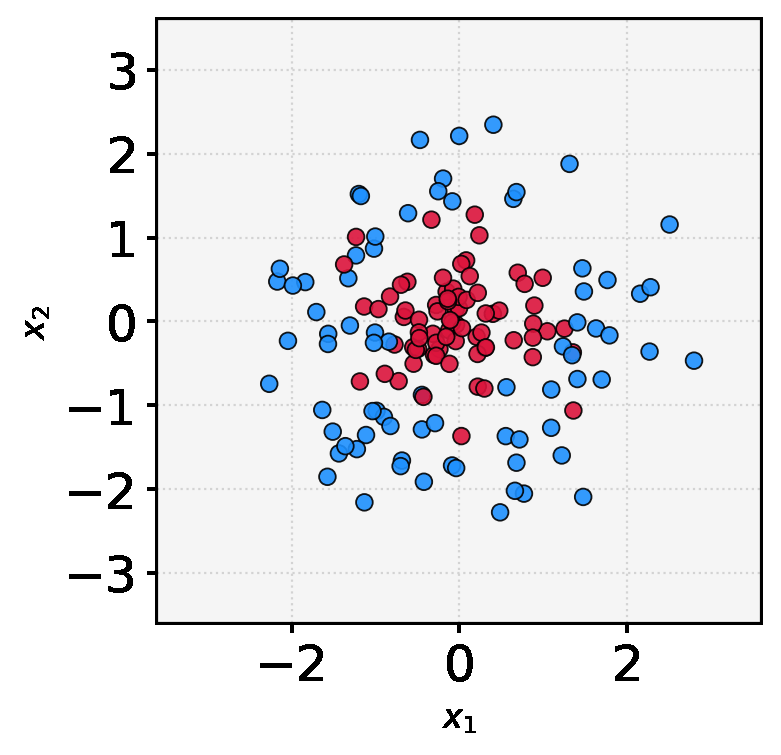

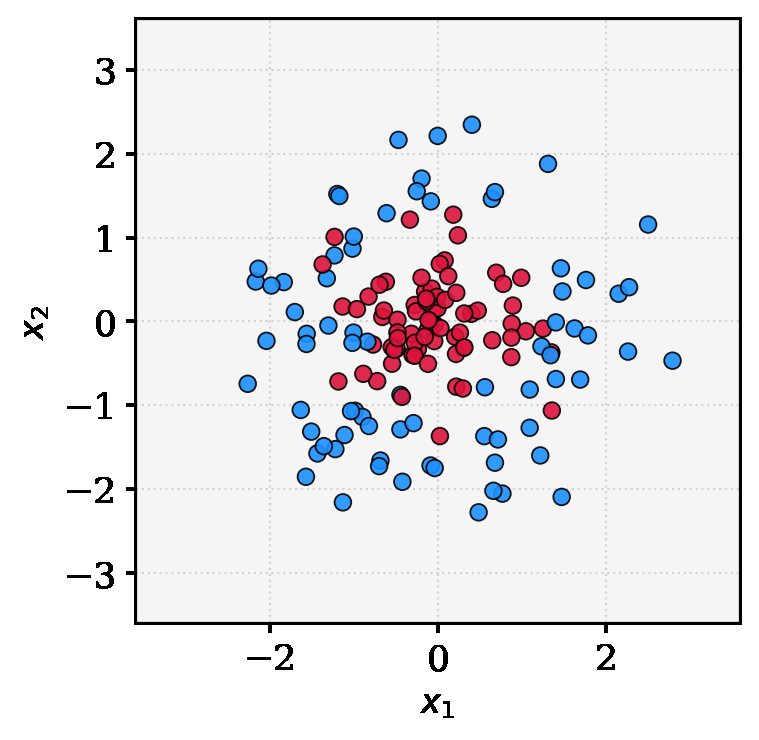

In [ ]:
#Display of the generated gif

from IPython.display import Image
traj = Image(filename="trajectory.gif", retina = True)
rtraj = Image(filename="trajectory_db.gif", retina = True)
display(traj, rtraj)


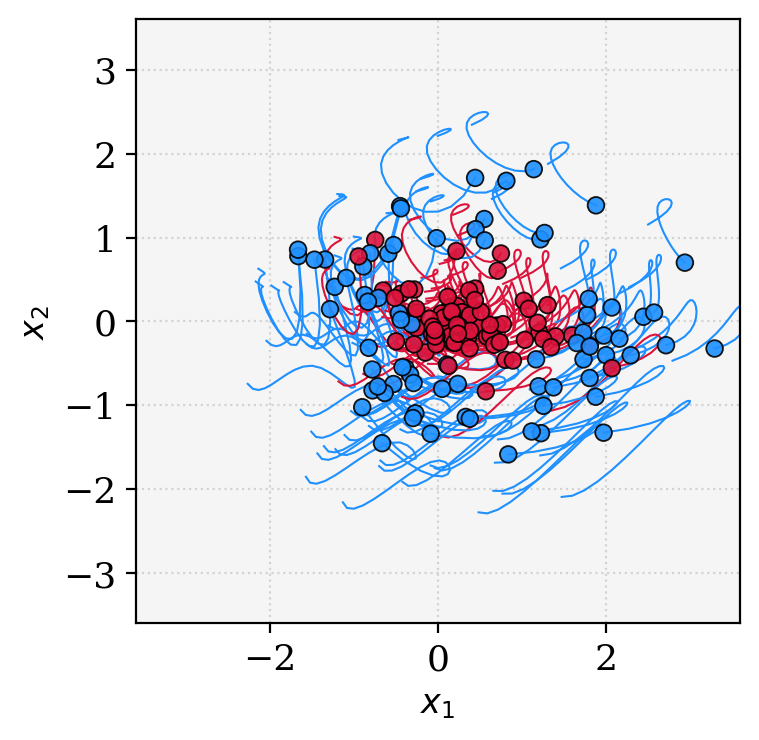

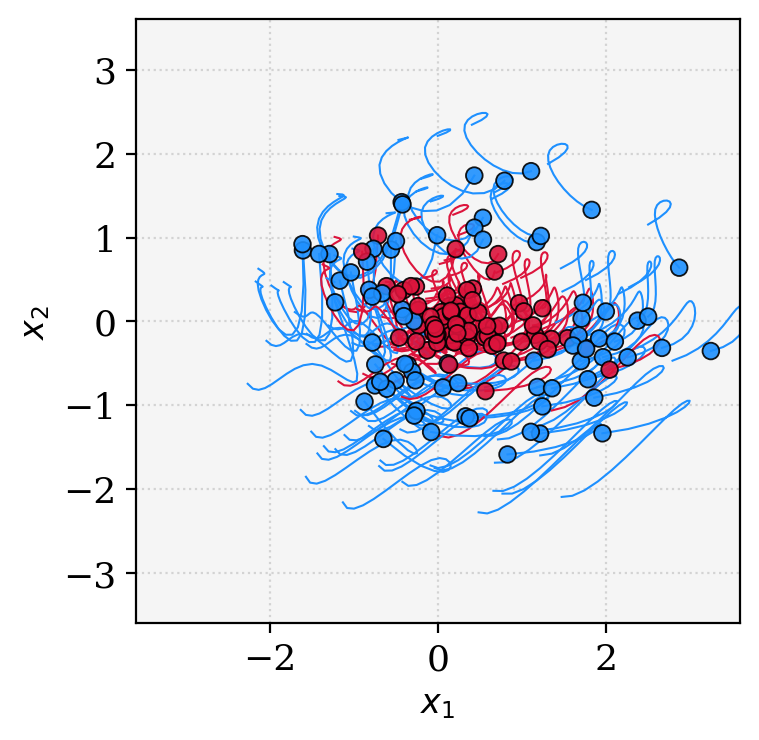

In [ ]:
from IPython.display import Image
traj = Image(filename="trajectory19.png", retina = True)
rtraj = Image(filename="trajectory_db19.png", retina = True)
display(traj, rtraj)

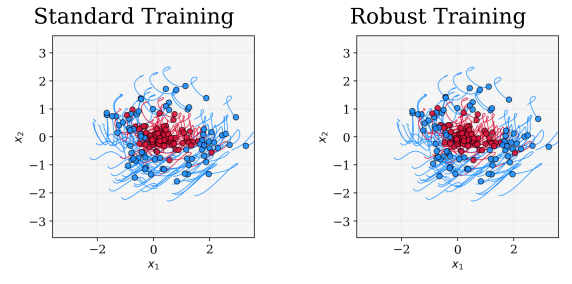

In [ ]:
plt.figure(dpi = 300, figsize=(10, 10))
plt.subplot(121)
img1 = imageio.imread('trajectory19.png')
plt.imshow(img1)
plt.title('Standard Training')
plt.axis('off')

plt.subplot(122)
img2 = imageio.imread('trajectory_db19.png')
plt.imshow(img2)
plt.title('Robust Training')
plt.axis('off')
plt.savefig('trajectory_comp.png', bbox_inches='tight', dpi=600, format='png', facecolor = 'white')
plt.show()

/var/folders/mr/rhl90_4n1sl5ykvnqh3d18t40000gn/T/ipykernel_80644/2757329608.py:2: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  plt.xlim(0, len(trainer_anode.histories['epoch_loss_history']) - 1)


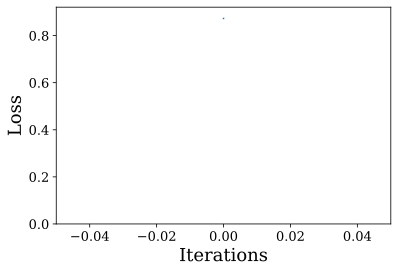

/var/folders/mr/rhl90_4n1sl5ykvnqh3d18t40000gn/T/ipykernel_80644/2757329608.py:9: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  plt.xlim(0, len(trainer_rnode.histories['epoch_loss_history']) - 1)


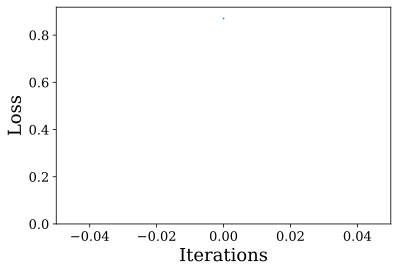

In [20]:
plt.plot(trainer_anode.histories['epoch_loss_history'])
plt.xlim(0, len(trainer_anode.histories['epoch_loss_history']) - 1)
plt.ylim(0)
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

plt.plot(trainer_rnode.histories['epoch_loss_history'])
plt.xlim(0, len(trainer_rnode.histories['epoch_loss_history']) - 1)
plt.ylim(0)
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()